## Notebook to score cells based on gene set

attempt to use this functionality for determing scores for
- disease associated microglia (DAM) 
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799
        - "DAM signature (Cst7, Csf1, Lpl, Apoe, Spp1, Cd74, Itgax)"
- senescence
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799?via%3Dihub
        - "custom senescence signature (Cdkn2a, Cdkn1a, Cdkn2d, Casp8, Il1b, Glb1, Serpine1)"
    - Tabula Muris Consortium. A single-cell transcriptomic atlas characterizes ageing tissues in the mouse. Nature 2020;583:590–5.
    https://pubmed.ncbi.nlm.nih.gov/32669714/
        - Canonical Senescence Pathway (ATM,BMI1,CCND1,CCNE1,CDK2,CDK4,CDK6,CDKN1A,CDKN2A,CDKN2D,CHEK1,CHEK2,E2F1,E2F3,ETS1,ETS2,MDM2,RB1,RBL2,SATB1,TP53,TWIST1)
        - Senescence Responses (AKT1,CALR,CCL2,CCL20,CCL5,CCL8,CD44,COL1A1,COL3A1,CSF2,CXCL1,CXCL2,CXCL5,CXCL8,FGF2,FGF7,FN1,GLB1,ICAM,IGFBP2,IGFBP4,IGFBP7,IL11,IL1A,IL1B,IL6,LIP,LMNB1,MMP1,MMP10,MMP12,MMP3,NFIA,PLAUR,PTEN,SPARC,SERPINB2,SERPINE1,TBX2,TBX3,TGFB1I1,THBS1\xca(TSP-1),TIMP1,TIMP2,TNF,VEGFA,VEGFB,VIM)
        - Senescence Initiators (ABL1,AKT1,ALDH1A3,CCNA2,CCNB1,CDC25C,CDKN1B,CDKN1C,CDKN2B,CDKN2C,CITED2,CREG1,EGR1,GADD45A,GSK3B,HRAS,ID1,IFNG,IGF1,IGF1R,IGFBP3,IGFBP5,IGFBP7,ING1,IRF3,IRF5,IRF7,MAP2K1,,MAP2K3,MAP2K6,MAPK14,MAPK14,MORC3,MYC,NBN,NFKB1,NOX4,PCNA,PIK3CA,PLAU,PRKCD,RBL1,SIRT1,SOD1,SOD2,TERF2,TERT,TGFB1,TP53BP1)
    


In [1]:
!date

Mon Oct 17 23:22:31 EDT 2022


#### import libraries

In [2]:
import scanpy as sc
from anndata import AnnData
from numpy import ndarray
from random import seed, randint
from scipy.stats import zscore
from pandas import DataFrame
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from seaborn import scatterplot

%matplotlib inline
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings(action='ignore')

#### set notebook variables

In [3]:
# naming
project = 'aging'

# directories 
wrk_dir = f'/labshare/raph/datasets/adrd_neuro/{project}'
quants_dir = f'{wrk_dir}/demux'

# in files
in_file = f'{quants_dir}/{project}.pegasus.leiden_085.subclustered.h5ad'

# variables
DEBUG = True
dpi_value = 50
gene_sets = {'DAM': ['CST7', 'CSF1', 'LPL', 'APOE', 'SPP1', 'CD74', 'ITGAX'],
             'CSS': ['CDKN2A', 'CDKN1A', 'CDKN2D', 'CASO8', 'IL1B', 'GLB1', 'SERPINE1'],
             'CSP': ['ATM', 'BMI1', 'CCND1', 'CCNE1', 'CDK2', 'CDK4', 'CDK6', 
                     'CDKN1A', 'CDKN2A', 'CDKN2D', 'CHEK1', 'CHEK2', 'E2F1', 
                     'E2F3', 'ETS1', 'ETS2', 'MDM2', 'RB1', 'RBL2', 'SATB1', 
                     'TP53', 'TWIST1'],
             'SR': ['AKT1', 'CALR', 'CCL2', 'CCL20', 'CCL5', 'CCL8', 'CD44', 
                    'COL1A1', 'COL3A1', 'CSF2', 'CXCL1', 'CXCL2', 'CXCL5', 
                    'CXCL8', 'FGF2', 'FGF7', 'FN1', 'GLB1', 'ICAM', 'IGFBP2', 
                    'IGFBP4', 'IGFBP7', 'IL11', 'IL1A', 'IL1B', 'IL6', 'LIP',
                    'LMNB1', 'MMP1', 'MMP10', 'MMP12', 'MMP3', 'NFIA', 'PLAUR', 
                    'PTEN', 'SPARC', 'SERPINB2', 'SERPINE1', 'TBX2', 'TBX3', 
                    'TGFB1I1', 'THBS1\xca(TSP-1)', 'TIMP1', 'TIMP2', 'TNF', 
                    'VEGFA', 'VEGFB', 'VIM'],
             'SI': ['ABL1', 'AKT1', 'ALDH1A3', 'CCNA2', 'CCNB1', 'CDC25C', 
                    'CDKN1B', 'CDKN1C', 'CDKN2B', 'CDKN2C', 'CITED2', 'CREG1', 
                    'EGR1', 'GADD45A', 'GSK3B', 'HRAS', 'ID1', 'IFNG', 'IGF1', 
                    'IGF1R', 'IGFBP3', 'IGFBP5', 'IGFBP7', 'ING1', 'IRF3', 
                    'IRF5', 'IRF7', 'MAP2K1', 'MAP2K3', 'MAP2K6', 'MAPK14', 
                    'MAPK14', 'MORC3', 'MYC', 'NBN', 'NFKB1', 'NOX4', 'PCNA', 
                    'PIK3CA', 'PLAU', 'PRKCD', 'RBL1', 'SIRT1', 'SOD1', 'SOD2',
                    'TERF2', 'TERT', 'TGFB1', 'TP53BP1']}
exclude_cell_types = ['uncertain', 'uncertain-2', 'uncertain-3', 'Astrocyte-GFAP-Hi']
seed(42)

#### utilitiy functions

In [4]:
def score_gene_set(data: AnnData, set_name: str, genes: list, iter_cnt: int=100, 
                   num_devs: int=1, verbose: bool=False):
    print(f'scoring {set_name}')
    score_name = f'{set_name}_score'
    scores = ndarray(shape=(data.obs.shape[0], iter_cnt), dtype=float)
    print('bootstrapping score_genes', end='.')
    for index in range(0, iter_cnt):
        print(index, end='.')
        genes = list(set(gene_sets[set_name]) & set(data.var.index))
        temp_data = sc.tl.score_genes(data, genes, score_name=score_name, 
                                      copy=True, random_state=randint(0, 9999))
        scores[:,index] = temp_data.obs[score_name]
    data.obs[score_name] = scores.mean(axis=1)
    data.obs[f'is{set_name}'] = zscore(scores.mean(axis=1)) > num_devs
    data.obs[f'is{set_name}'].replace({True: set_name, False: f'non{set_name}'}, inplace=True)
    # find proportion of total cells where condition exists
    positive_cnt = data.obs.loc[data.obs[f'is{set_name}'] == set_name].shape[0]
    total_cnt = data.obs.shape[0]
    positive_frac = round(positive_cnt/total_cnt, 3)
    print(f'\nFractions of cells positive for {set_name} is {positive_frac} or \
{positive_cnt} of {total_cnt}')        
    print('visualizing', end='.')
    # show positive cells by Age
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        scatterplot(x='Age', y=score_name, data=data.obs, hue=f'is{set_name}')    
    # show dotplots of genes by cell-type and age group
    this_set = list(set(genes) & set(data.var.index))
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='new_anno', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='Age_group', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby=f'is{set_name}', 
                      mean_only_expressed=True)        
    # show score histogram
    data.obs[score_name].plot.hist()
    # visualize umap of positive cells and score
    pos_data = data[data.obs[f'is{set_name}'] == set_name]
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.umap(pos_data, color=['new_anno', score_name], legend_loc='on data')
    # visualize binarized score
    sc.tl.embedding_density(data, groupby=f'is{set_name}')
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.embedding_density(data, groupby=f'is{set_name}')
    # get counts by cell-type and brain region
    display(data.obs.groupby('new_anno')[f'is{set_name}'].value_counts())
    display(data.obs.groupby('Brain_region')[f'is{set_name}'].value_counts())    

### read the anndata (h5ad) file

In [5]:
%%time
adata = sc.read(in_file, cache=True)
print(adata)

Only considering the two last: ['.subclustered', '.h5ad'].
Only considering the two last: ['.subclustered', '.h5ad'].
AnnData object with n_obs × n_vars = 167945 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle',

### Plot the clusters

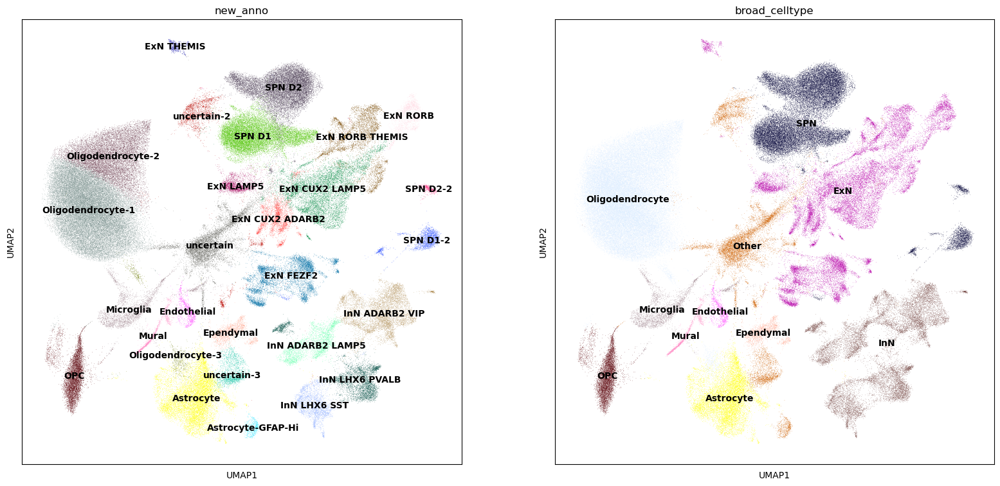

In [6]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [7]:
adata.obs.broad_celltype.value_counts()

Oligodendrocyte      50129
SPN                  33512
ExN                  28483
InN                  17733
Other                12753
Astrocyte            11289
OPC                   6682
Microglia             3265
Ependymal             1853
Mural                 1293
Endothelial            953
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

### remove cell-types that are known excludes

In [8]:
adata = adata[~adata.obs.new_anno.isin(exclude_cell_types)]
print(adata)

View of AnnData object with n_obs × n_vars = 155192 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap_085'
    varm: 'de_res', 'gmeans', 'gstds', 'means', 'pa

### replot the clusters without the excluded celltypes

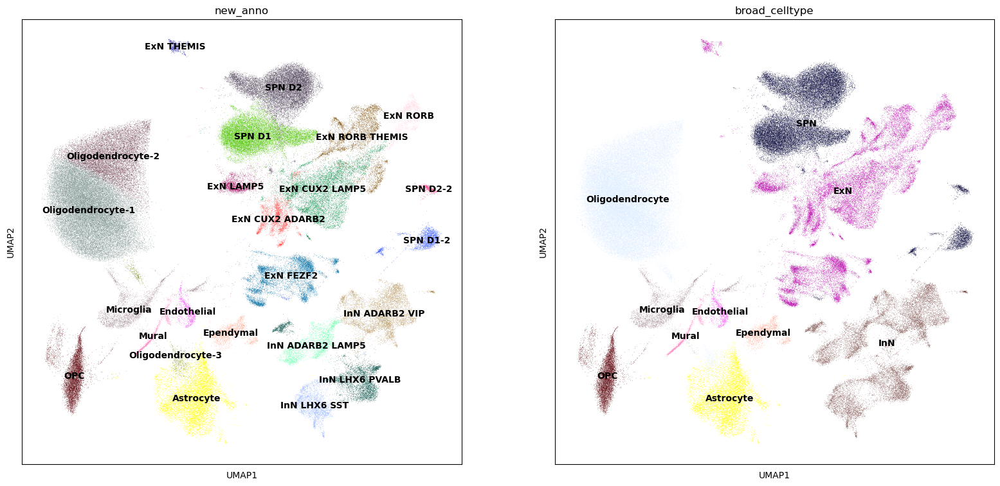

In [9]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [10]:
adata.obs.new_anno.value_counts()

Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            11289
ExN CUX2 LAMP5        9055
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
SPN D1-2              2388
ExN RORB              1966
ExN LAMP5             1963
Ependymal             1853
Mural                 1293
Endothelial            953
Oligodendrocyte-3      806
SPN D2-2               465
ExN THEMIS             461
Name: new_anno, dtype: int64

### generate density plot for brain region

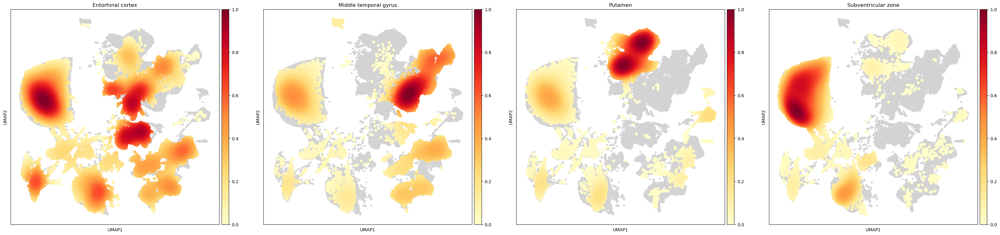

In [11]:
sc.tl.embedding_density(adata, groupby='Brain_region')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Brain_region')

### generate density plot for age group

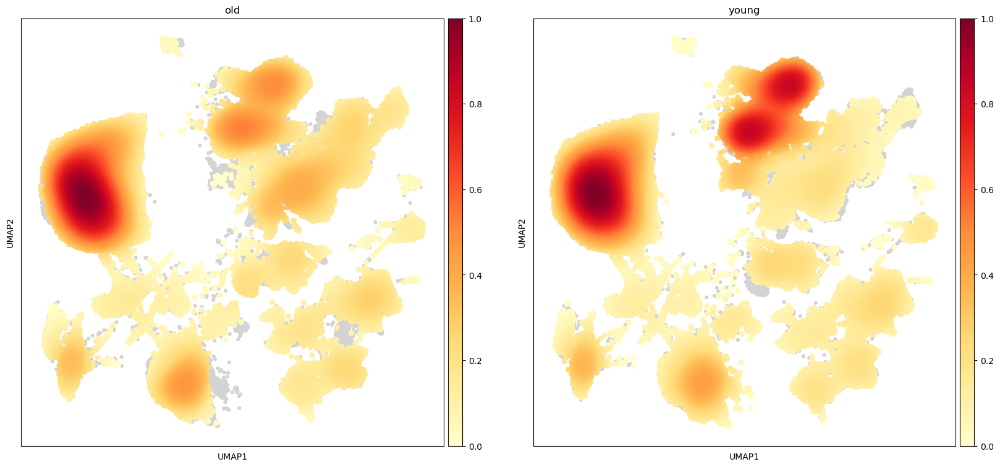

In [12]:
sc.tl.embedding_density(adata, groupby='Age_group')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Age_group')

### score the DAM

AnnData object with n_obs × n_vars = 3265 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_diffmap', 'X_f

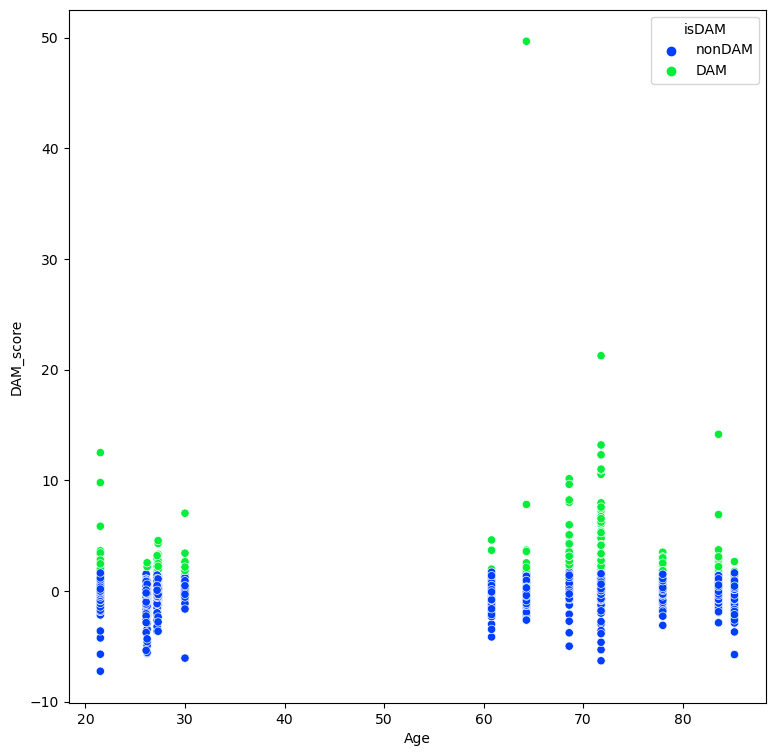

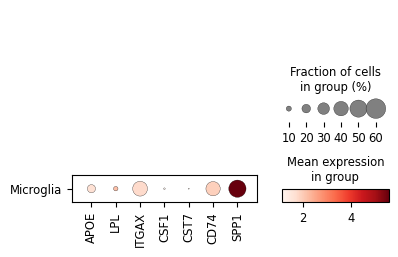

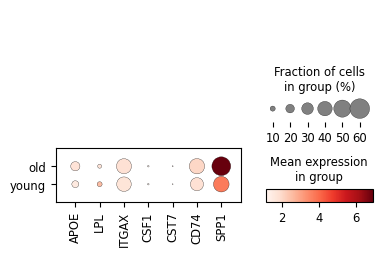

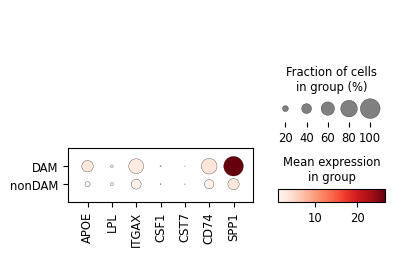

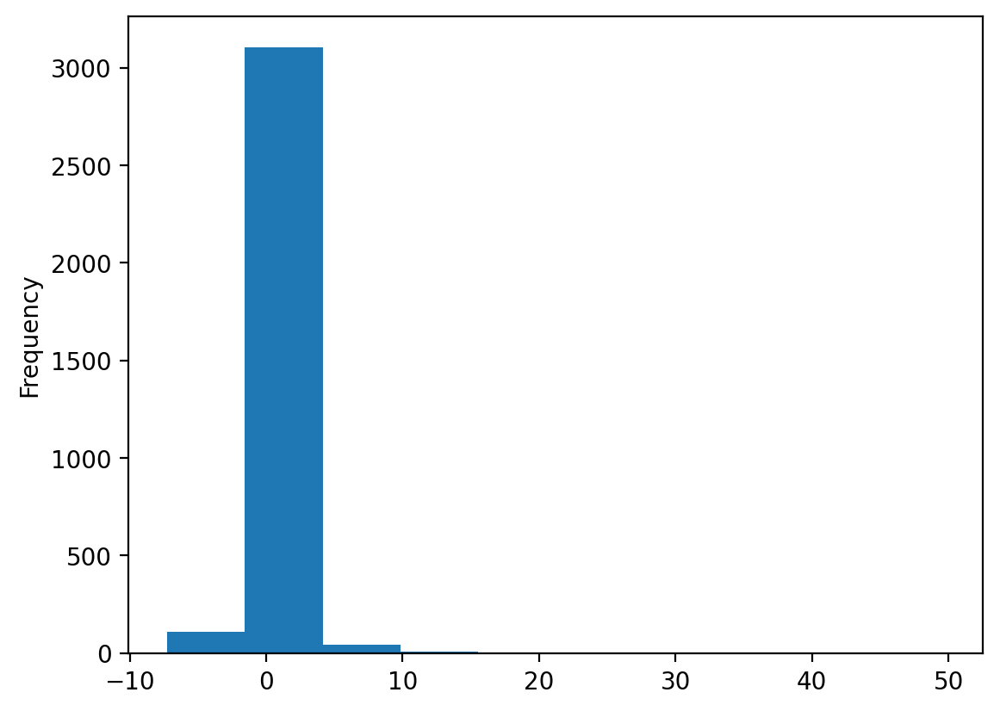

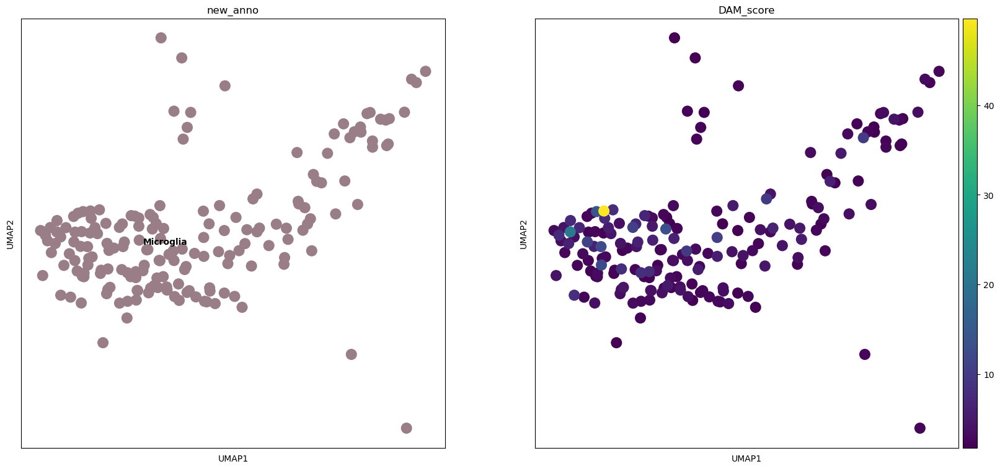

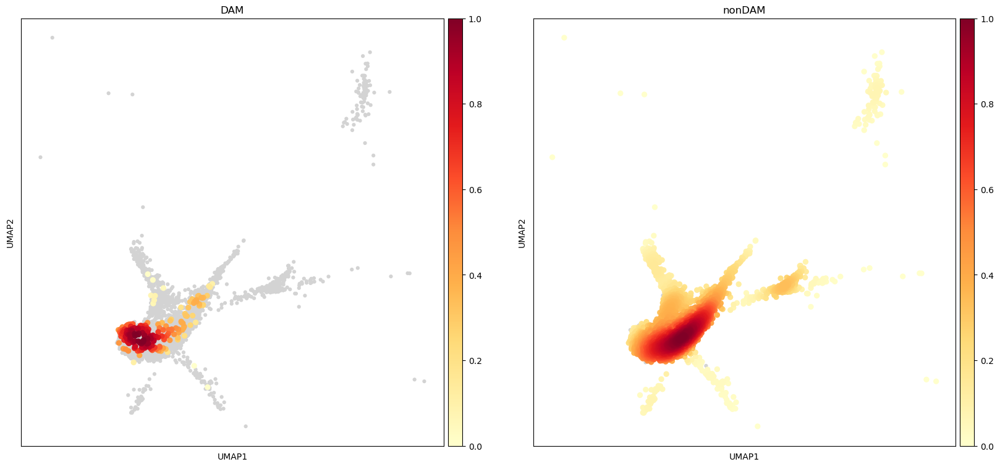

new_anno         
Microglia  nonDAM    3087
           DAM        178
Name: isDAM, dtype: int64

Brain_region                 
Entorhinal cortex      nonDAM    1210
                       DAM          9
Middle temporal gyrus  nonDAM     256
                       DAM          2
Putamen                nonDAM     661
                       DAM          9
Subventricular zone    nonDAM     960
                       DAM        158
Name: isDAM, dtype: int64

CPU times: user 32.5 s, sys: 2.13 s, total: 34.6 s
Wall time: 22.3 s


In [13]:
%%time
mg_data = adata[adata.obs.broad_celltype == 'Microglia'].copy()
print(mg_data)
score_gene_set(mg_data, 'DAM', gene_sets['DAM'], verbose=DEBUG)

### score the CSS, custom senescence signature

scoring CSS
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.
Fractions of cells positive for CSS is 0.099 or 15356 of 155192
visualizing.

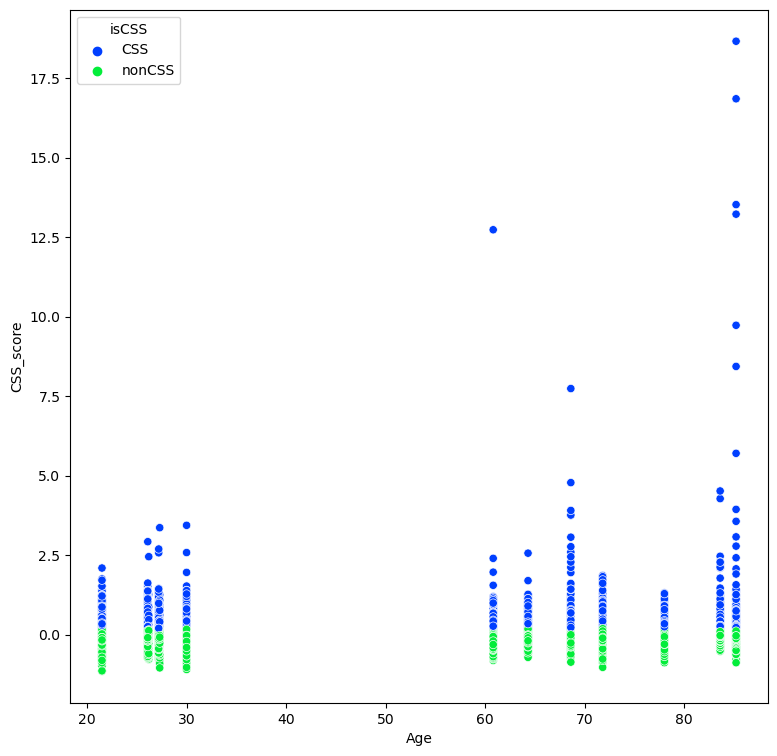

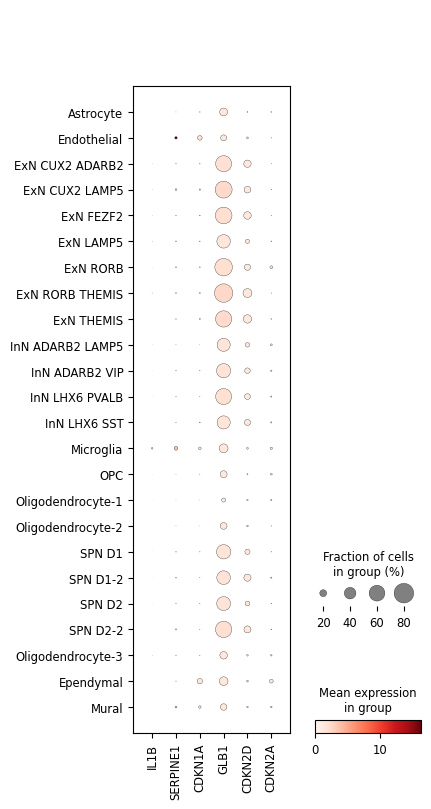

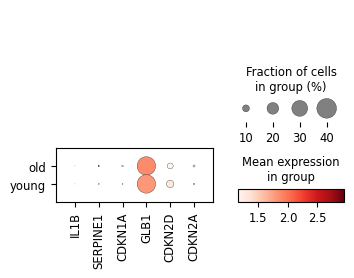

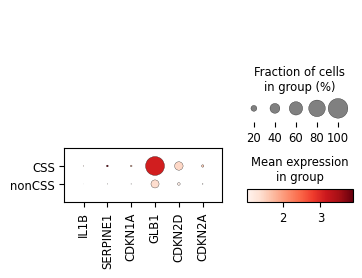

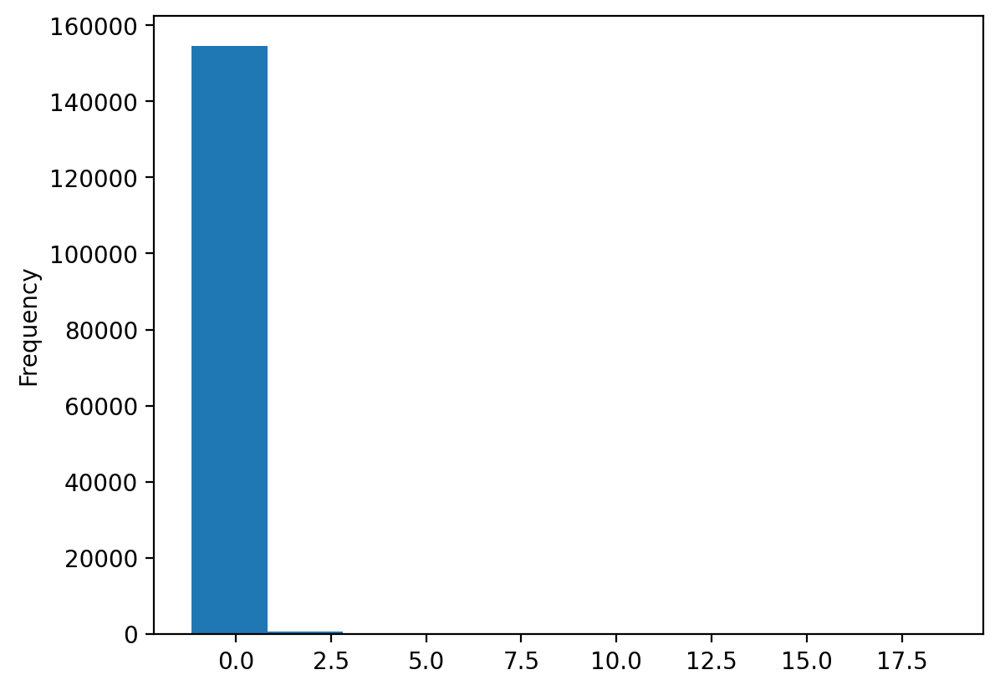

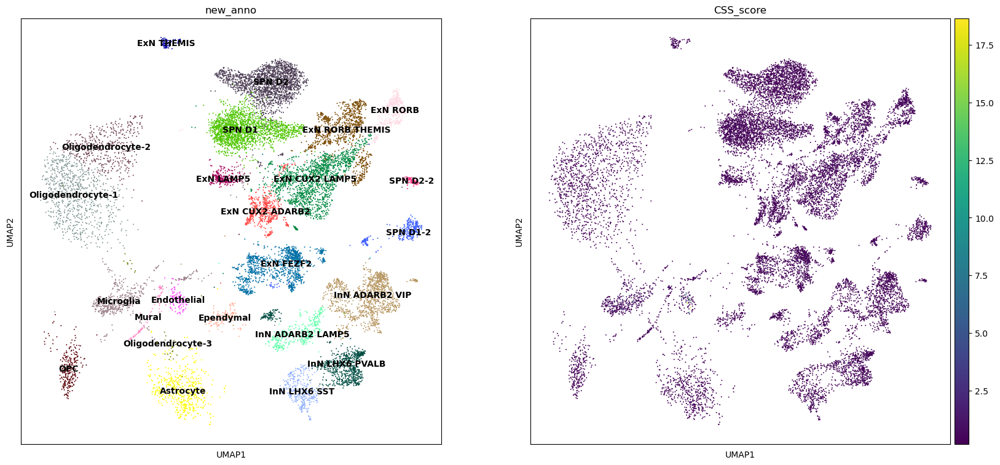

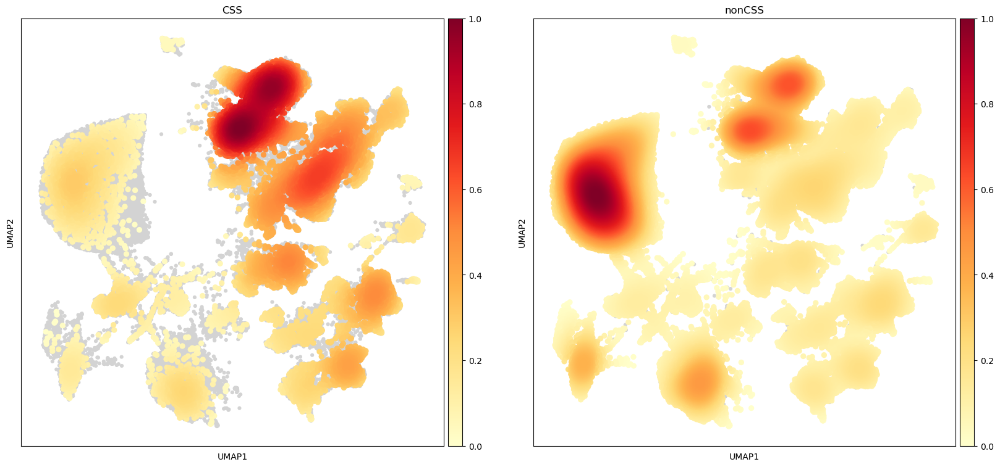

new_anno                 
Astrocyte          nonCSS    10746
                   CSS         543
Endothelial        nonCSS      859
                   CSS          94
ExN CUX2 ADARB2    nonCSS     2471
                   CSS         595
ExN CUX2 LAMP5     nonCSS     7393
                   CSS        1662
ExN FEZF2          nonCSS     5643
                   CSS        1199
ExN LAMP5          nonCSS     1697
                   CSS         266
ExN RORB           nonCSS     1509
                   CSS         457
ExN RORB THEMIS    nonCSS     4120
                   CSS        1010
ExN THEMIS         nonCSS      384
                   CSS          77
InN ADARB2 LAMP5   nonCSS     2829
                   CSS         387
InN ADARB2 VIP     nonCSS     5820
                   CSS        1194
InN LHX6 PVALB     nonCSS     3761
                   CSS         805
InN LHX6 SST       nonCSS     2573
                   CSS         364
Microglia          nonCSS     2752
                   CSS       

Brain_region                 
Entorhinal cortex      nonCSS    42560
                       CSS        4996
Middle temporal gyrus  nonCSS    21537
                       CSS        3857
Putamen                nonCSS    41893
                       CSS        4596
Subventricular zone    nonCSS    33846
                       CSS        1907
Name: isCSS, dtype: int64

CPU times: user 14min 38s, sys: 1min 53s, total: 16min 32s
Wall time: 16min 6s


In [14]:
%%time
score_gene_set(adata, 'CSS', gene_sets['CSS'], verbose=DEBUG)

### score the CSP, Canonical Senescence Pathway

scoring CSP
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.
Fractions of cells positive for CSP is 0.054 or 8346 of 155192
visualizing.

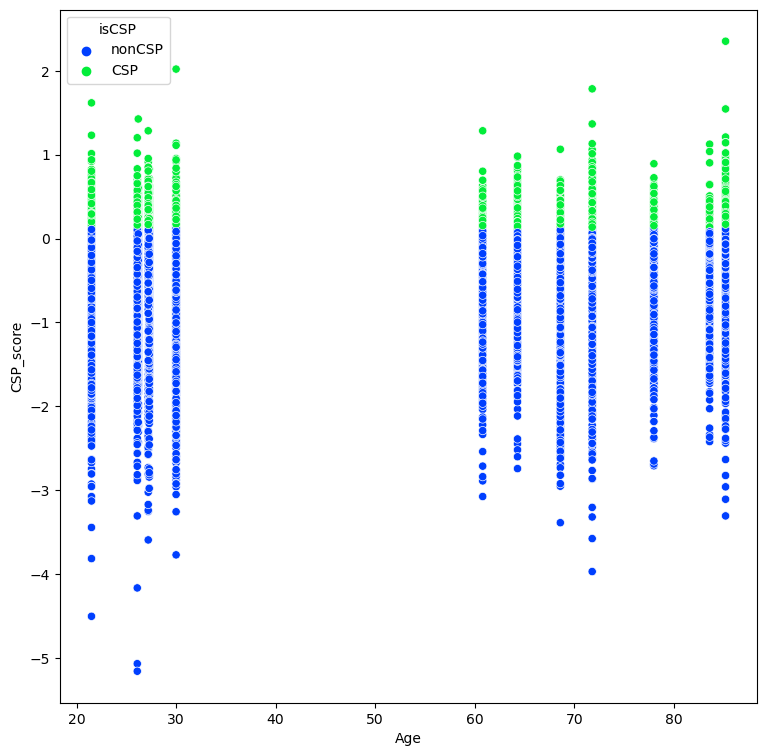

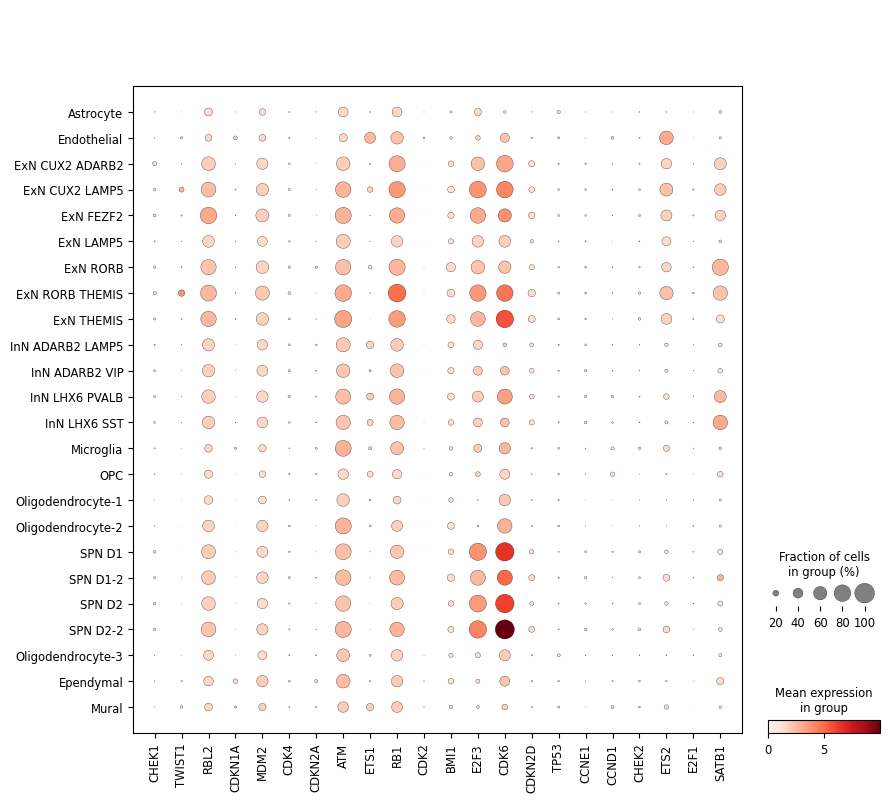

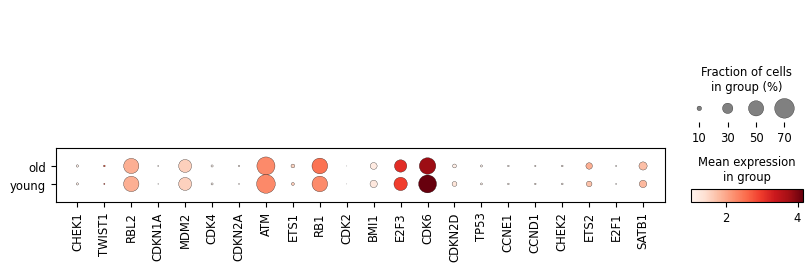

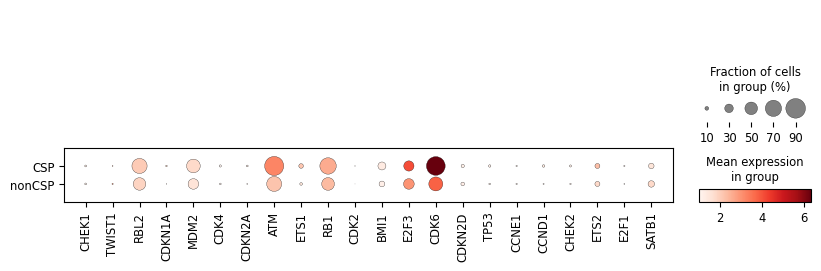

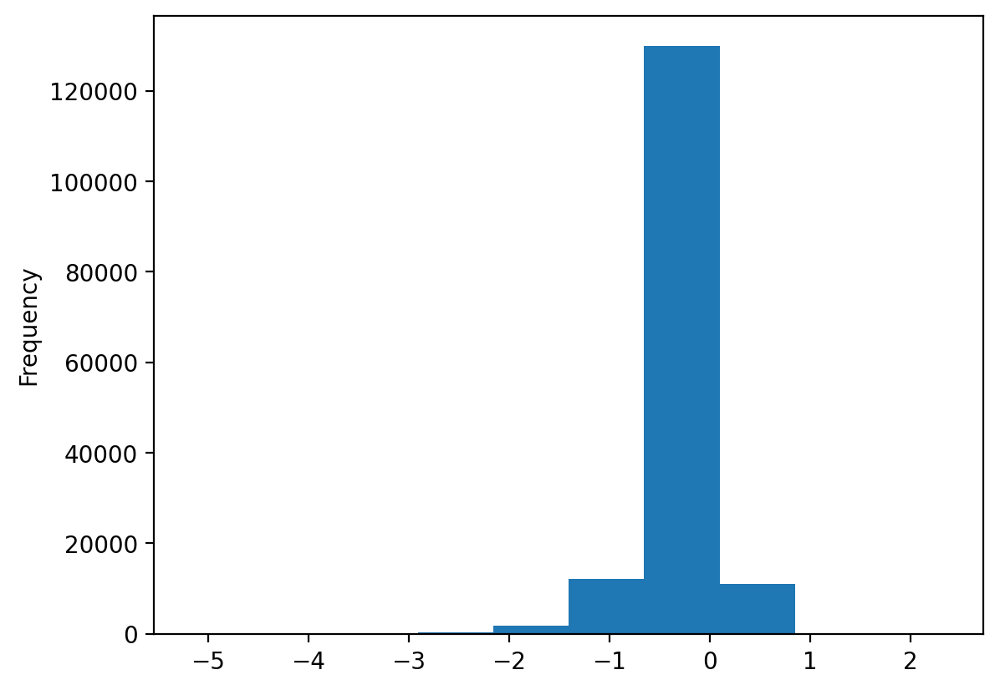

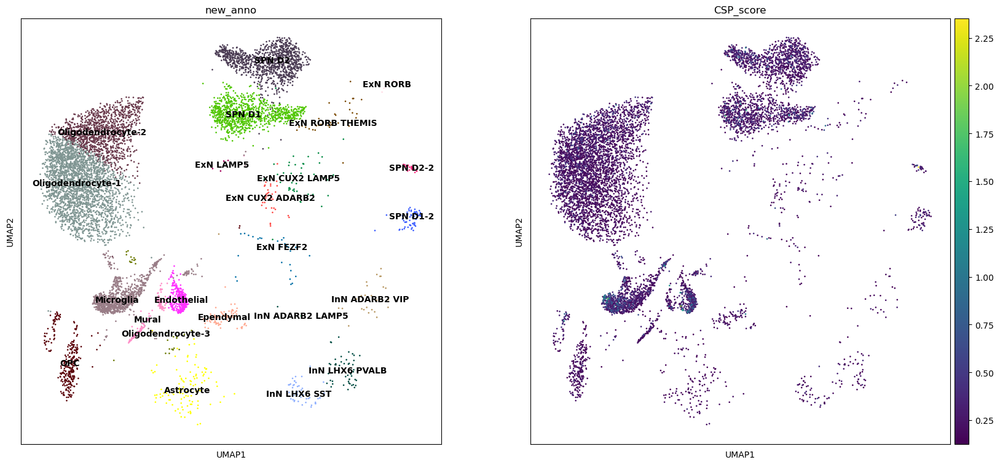

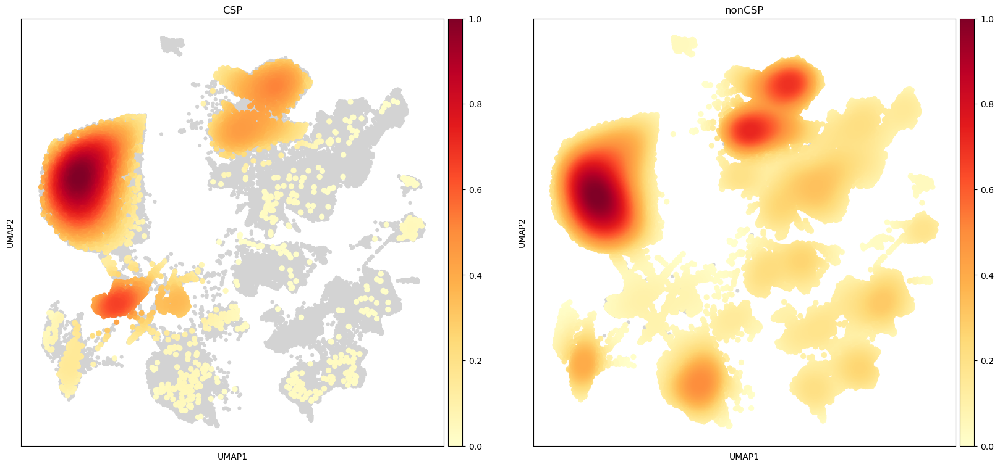

new_anno                 
Astrocyte          nonCSP    11173
                   CSP         116
Endothelial        nonCSP      587
                   CSP         366
ExN CUX2 ADARB2    nonCSP     3033
                   CSP          33
ExN CUX2 LAMP5     nonCSP     9009
                   CSP          46
ExN FEZF2          nonCSP     6815
                   CSP          27
ExN LAMP5          nonCSP     1959
                   CSP           4
ExN RORB           nonCSP     1960
                   CSP           6
ExN RORB THEMIS    nonCSP     5098
                   CSP          32
ExN THEMIS         nonCSP      461
                   CSP           0
InN ADARB2 LAMP5   nonCSP     3215
                   CSP           1
InN ADARB2 VIP     nonCSP     6988
                   CSP          26
InN LHX6 PVALB     nonCSP     4516
                   CSP          50
InN LHX6 SST       nonCSP     2889
                   CSP          48
Microglia          nonCSP     2145
                   CSP       

Brain_region                 
Entorhinal cortex      nonCSP    46231
                       CSP        1325
Middle temporal gyrus  nonCSP    24659
                       CSP         735
Putamen                nonCSP    43558
                       CSP        2931
Subventricular zone    nonCSP    32398
                       CSP        3355
Name: isCSP, dtype: int64

CPU times: user 15min 40s, sys: 2min, total: 17min 40s
Wall time: 17min 14s


In [15]:
%%time
score_gene_set(adata, 'CSP', gene_sets['CSP'], verbose=DEBUG)

### score the SR, Senescence Responses

scoring SR
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.
Fractions of cells positive for SR is 0.062 or 9662 of 155192
visualizing.

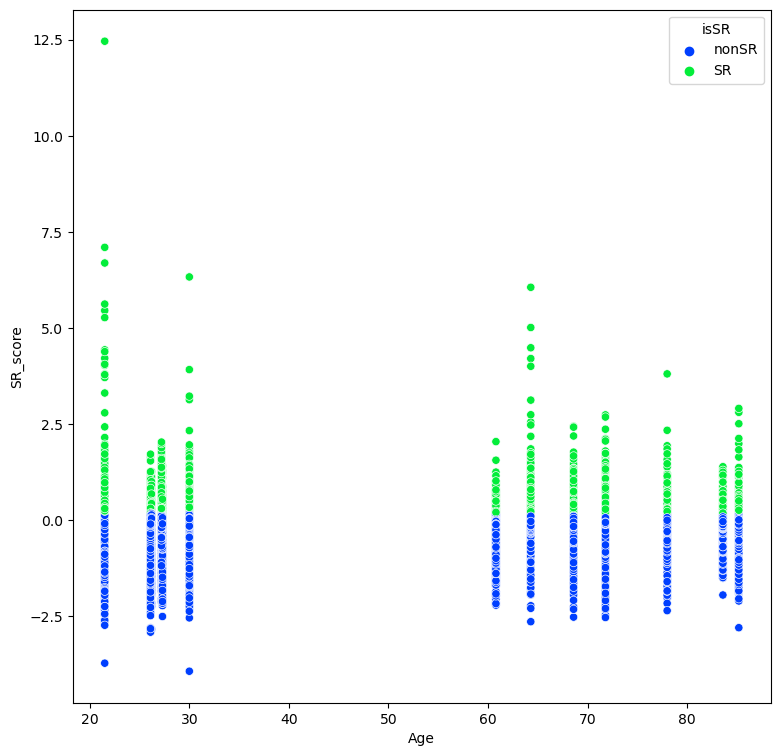

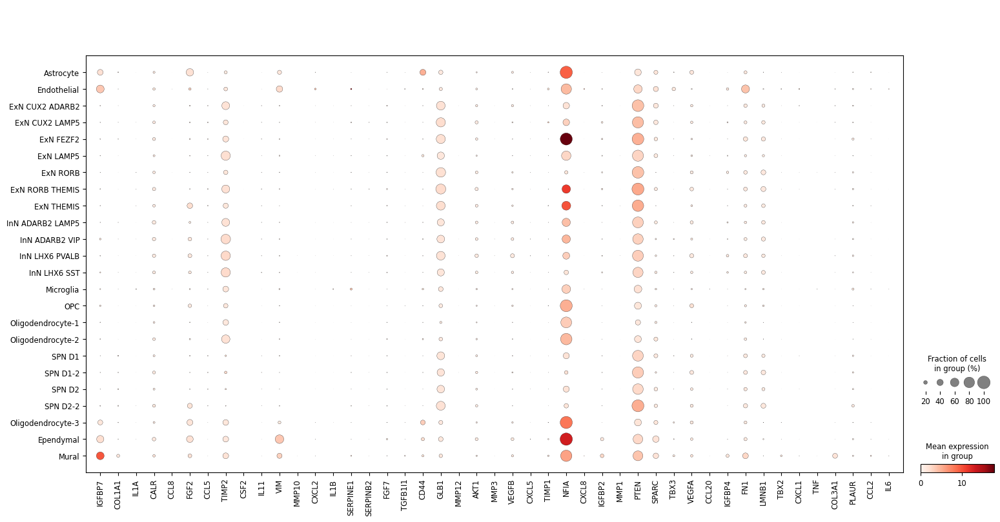

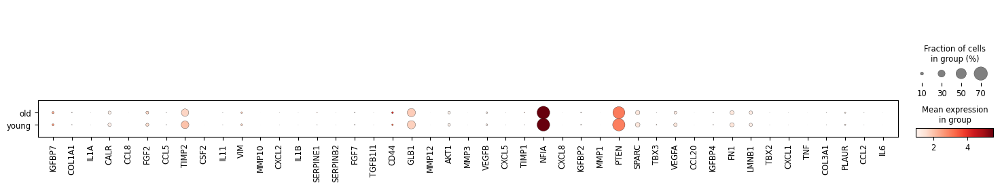

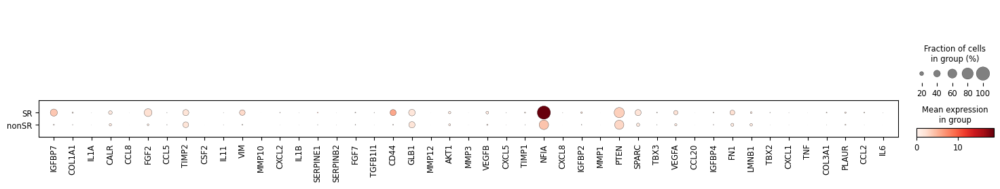

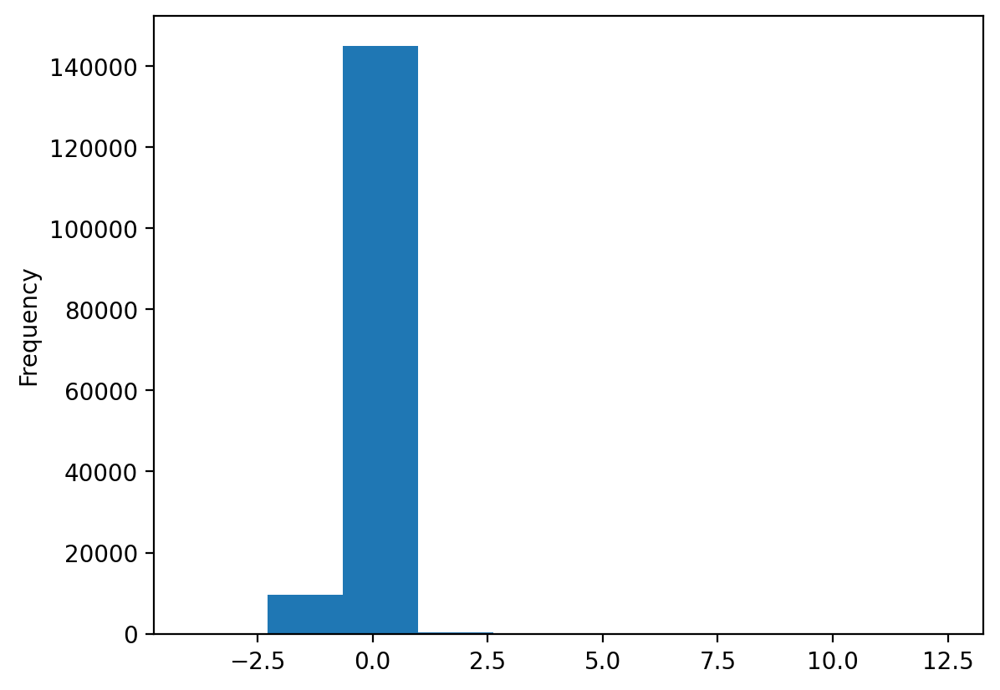

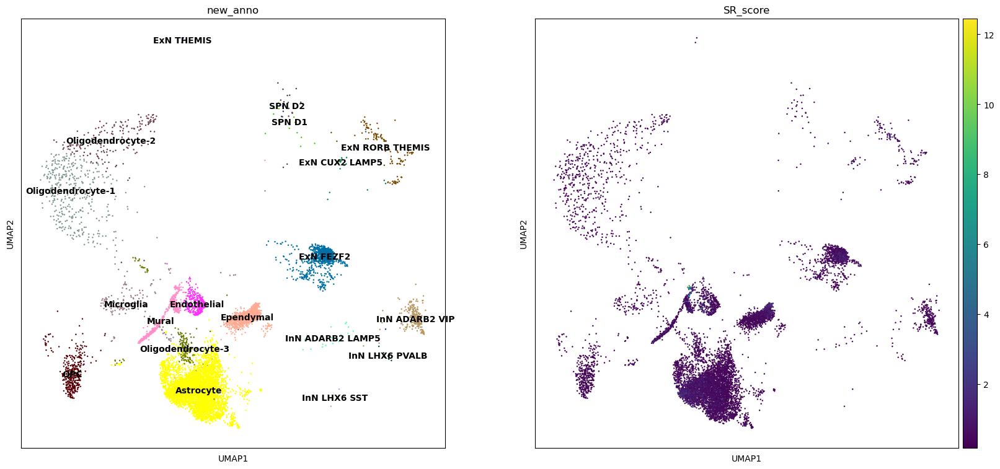

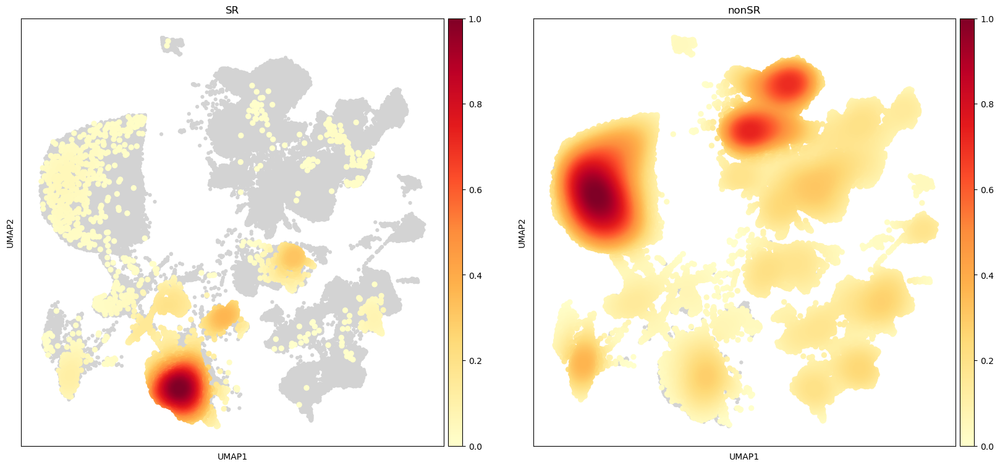

new_anno                
Astrocyte          nonSR     6256
                   SR        5033
Endothelial        nonSR      621
                   SR         332
ExN CUX2 ADARB2    nonSR     3066
                   SR           0
ExN CUX2 LAMP5     nonSR     9035
                   SR          20
ExN FEZF2          nonSR     5881
                   SR         961
ExN LAMP5          nonSR     1963
                   SR           0
ExN RORB           nonSR     1966
                   SR           0
ExN RORB THEMIS    nonSR     5008
                   SR         122
ExN THEMIS         nonSR      459
                   SR           2
InN ADARB2 LAMP5   nonSR     3199
                   SR          17
InN ADARB2 VIP     nonSR     6790
                   SR         224
InN LHX6 PVALB     nonSR     4557
                   SR           9
InN LHX6 SST       nonSR     2935
                   SR           2
Microglia          nonSR     3114
                   SR         151
OPC                nonS

Brain_region                
Entorhinal cortex      nonSR    44713
                       SR        2843
Middle temporal gyrus  nonSR    24400
                       SR         994
Putamen                nonSR    45069
                       SR        1420
Subventricular zone    nonSR    31348
                       SR        4405
Name: isSR, dtype: int64

CPU times: user 15min 21s, sys: 2min, total: 17min 22s
Wall time: 16min 56s


In [16]:
%%time
score_gene_set(adata, 'SR', gene_sets['SR'], verbose=DEBUG)

### score the SI, Senescence Initiators

scoring SI
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.
Fractions of cells positive for SI is 0.076 or 11728 of 155192
visualizing.

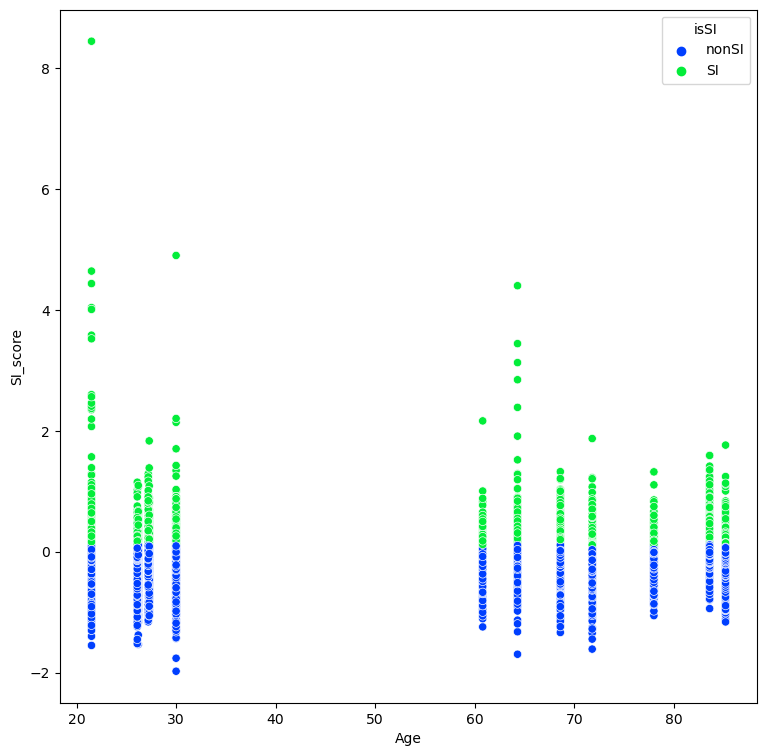

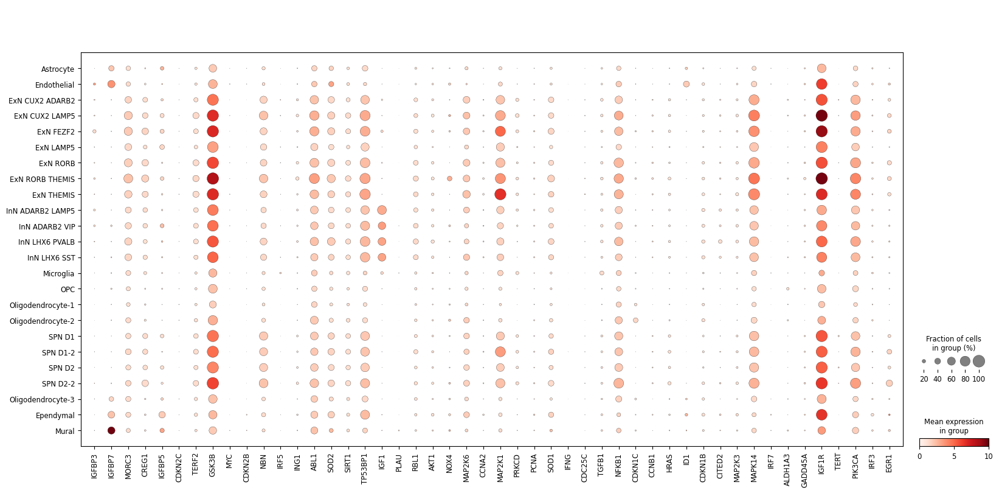

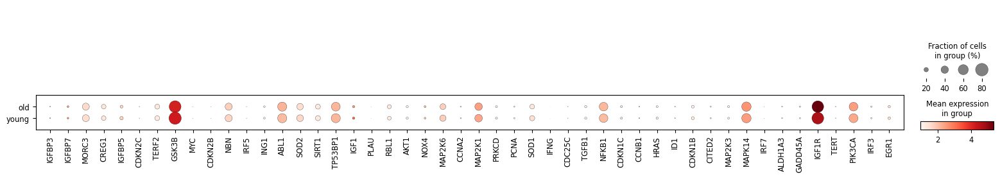

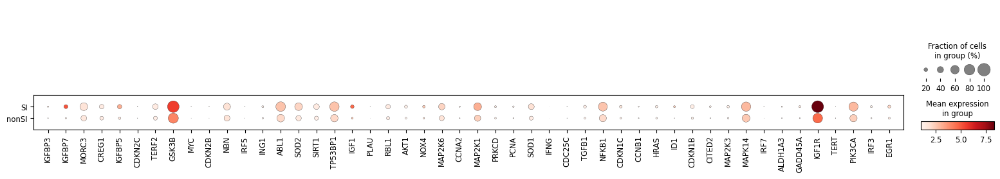

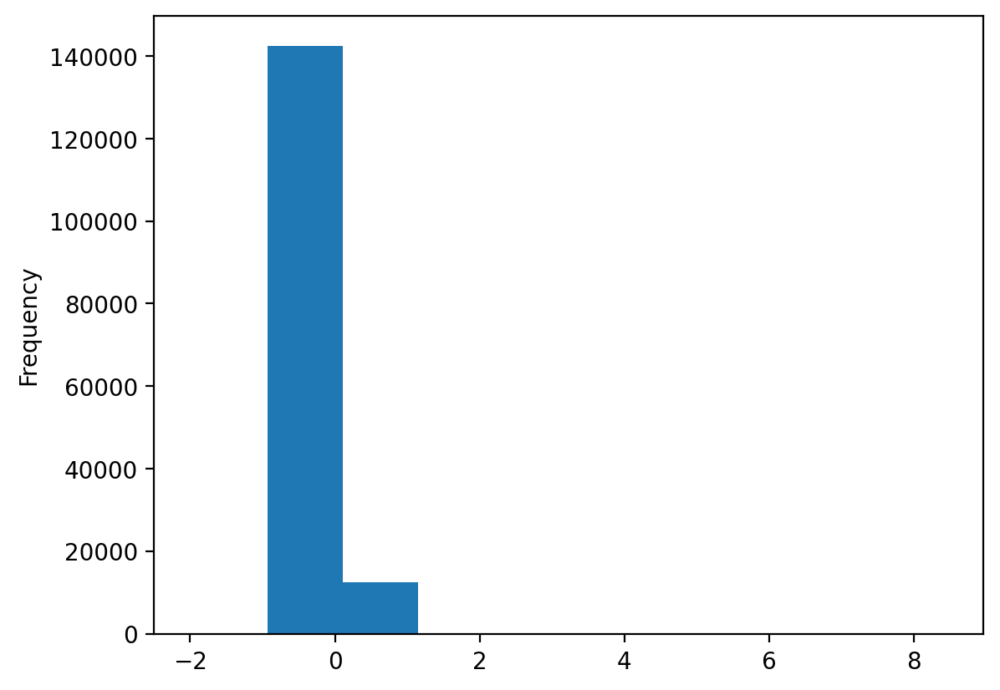

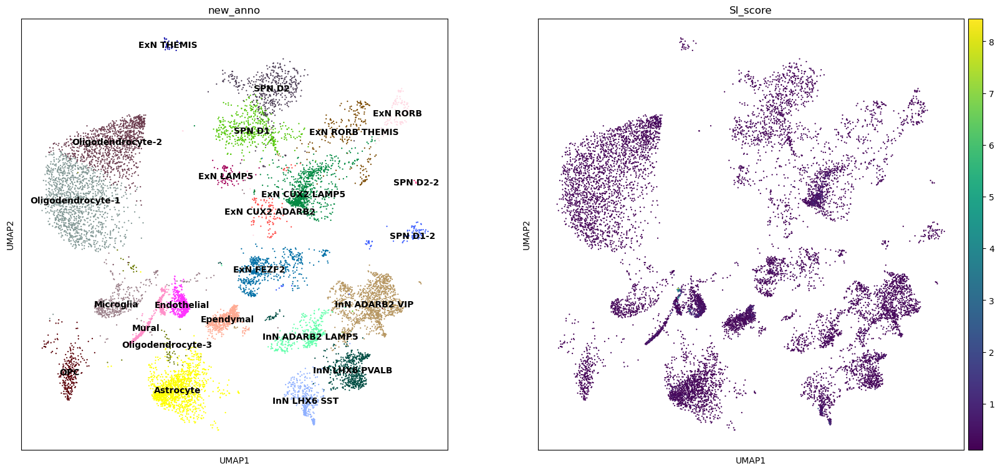

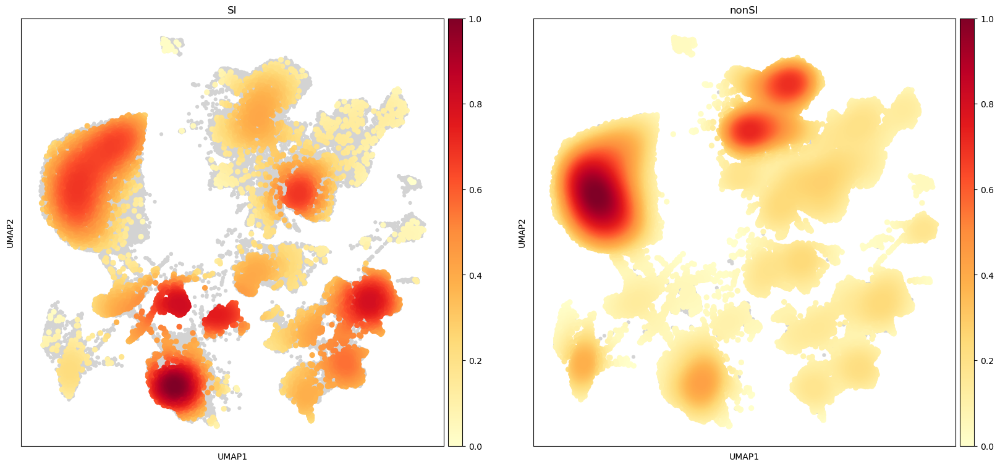

new_anno                
Astrocyte          nonSI     9977
                   SI        1312
Endothelial        SI         532
                   nonSI      421
ExN CUX2 ADARB2    nonSI     2962
                   SI         104
ExN CUX2 LAMP5     nonSI     8189
                   SI         866
ExN FEZF2          nonSI     6287
                   SI         555
ExN LAMP5          nonSI     1895
                   SI          68
ExN RORB           nonSI     1842
                   SI         124
ExN RORB THEMIS    nonSI     4921
                   SI         209
ExN THEMIS         nonSI      436
                   SI          25
InN ADARB2 LAMP5   nonSI     2838
                   SI         378
InN ADARB2 VIP     nonSI     5765
                   SI        1249
InN LHX6 PVALB     nonSI     3968
                   SI         598
InN LHX6 SST       nonSI     2531
                   SI         406
Microglia          nonSI     2860
                   SI         405
OPC                nonS

Brain_region                
Entorhinal cortex      nonSI    44112
                       SI        3444
Middle temporal gyrus  nonSI    22817
                       SI        2577
Putamen                nonSI    44851
                       SI        1638
Subventricular zone    nonSI    31684
                       SI        4069
Name: isSI, dtype: int64

CPU times: user 15min 31s, sys: 1min 57s, total: 17min 28s
Wall time: 17min 2s


In [17]:
%%time
score_gene_set(adata, 'SI', gene_sets['SI'], verbose=DEBUG)

### visualize combined Senescence scores

In [18]:
score_cols = ['CSS_score', 'CSP_score', 'SR_score', 'SI_score']
other_cols = ['new_anno', 'Age_group', 'broad_celltype']
temp = adata.obs[score_cols + other_cols].copy()
print(temp.shape)
display(temp.head())

(155192, 7)


,CSS_score,CSP_score,SR_score,SI_score,new_anno,Age_group,broad_celltype
barcodekey,,,,,,,
AAACCCACAGTTGGTT-1,0.991369,-0.391847,-0.705897,-0.358004,ExN CUX2 LAMP5,young,ExN
AAACCCATCTCGCTTG-1,-0.048410,-0.509405,-0.328037,-0.145817,ExN CUX2 LAMP5,old,ExN
AAACGAACACGGTAGA-1,-0.058524,-0.023305,-0.016669,-0.026645,Oligodendrocyte-1,young,Oligodendrocyte
AAACGCTAGAACTCCT-1,-0.253878,-0.233495,-0.858231,-0.474953,ExN CUX2 LAMP5,old,ExN
AAACGCTAGTCAGCCC-1,-0.054507,-0.349893,-0.886398,0.210504,ExN CUX2 LAMP5,old,ExN


In [19]:
from umap import UMAP

def plot_umap_clusters(umap_df, hue_cov=None, style_cov=None, size_cov=None):
    with rc_context({'figure.figsize': (8, 8), 'figure.dpi': 50}):
        plt.style.use('seaborn-bright')
        sns_plot = scatterplot(x='x_umap',y='y_umap', 
                                   hue=hue_cov, style=style_cov, size=size_cov, 
                                   data=umap_df, palette='viridis')
        plt.xlabel('x-umap')
        plt.ylabel('y-umap')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, 
                   borderaxespad=0,prop={'size': 10})
        plt.show()
        
def generate_umap_covs_df(this_df, other_covs_df=None, 
                             rnd_digits=3, merge_input=False):
    #run UMAP on the data frame features
    umap_results = UMAP(random_state=42).fit_transform(this_df)
    umap_df = DataFrame(umap_results,columns=['x_umap','y_umap'],
                                       index=this_df.index).round(rnd_digits)
    if merge_input:
        umap_df = umap_df.merge(this_df,left_index=True,right_index=True)
    if other_covs_df is not None:
        umap_df = umap_df.merge(other_covs_df, how='left', 
                                left_index=True, right_index=True)
    print(f'The dimensions of the umap df and the traits are {umap_df.shape}')
    return umap_df        

In [20]:
%%time
umap_df = generate_umap_covs_df(temp[score_cols], temp)

The dimensions of the umap df and the traits are (155192, 9)
CPU times: user 52min 53s, sys: 5min 45s, total: 58min 39s
Wall time: 2min 49s


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


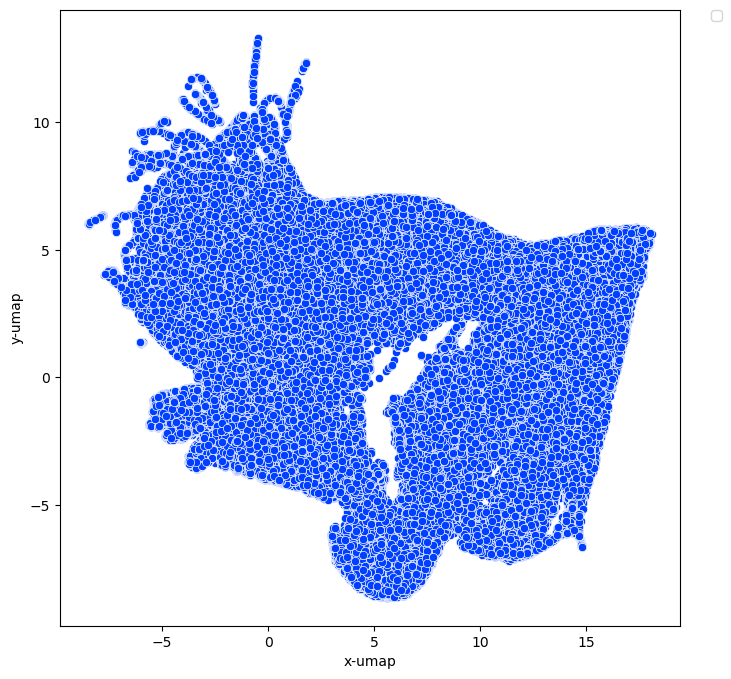

CPU times: user 348 ms, sys: 9.98 ms, total: 358 ms
Wall time: 355 ms


In [21]:
%%time
plot_umap_clusters(umap_df)

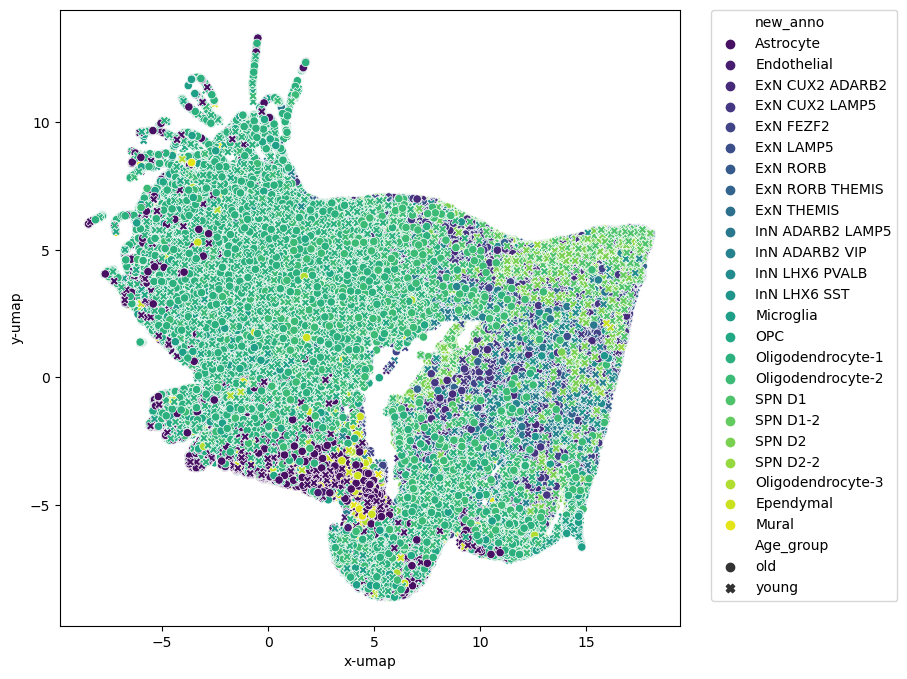

In [22]:
plot_umap_clusters(umap_df, hue_cov='new_anno', style_cov='Age_group')

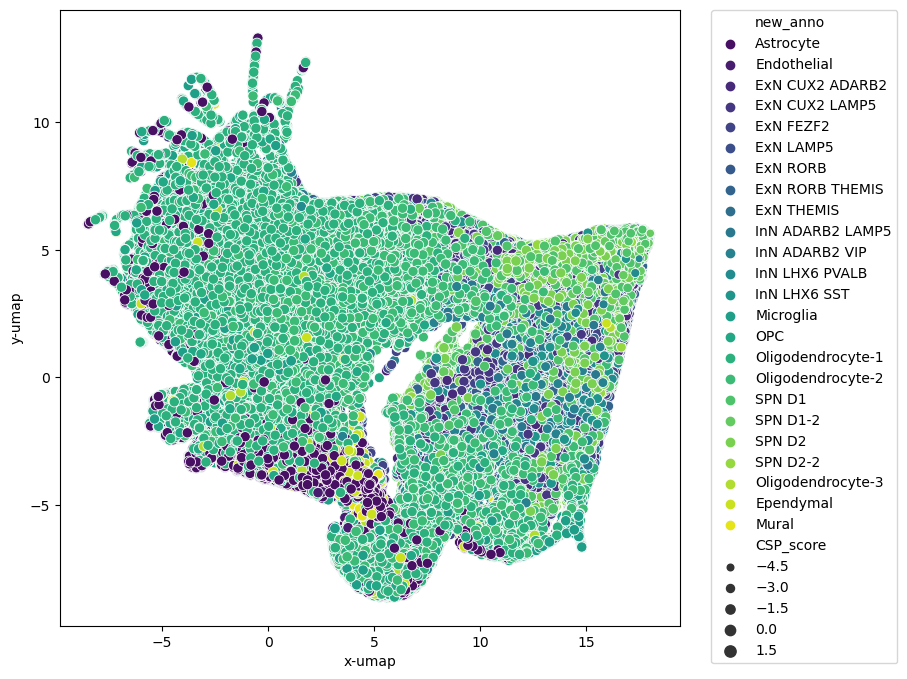

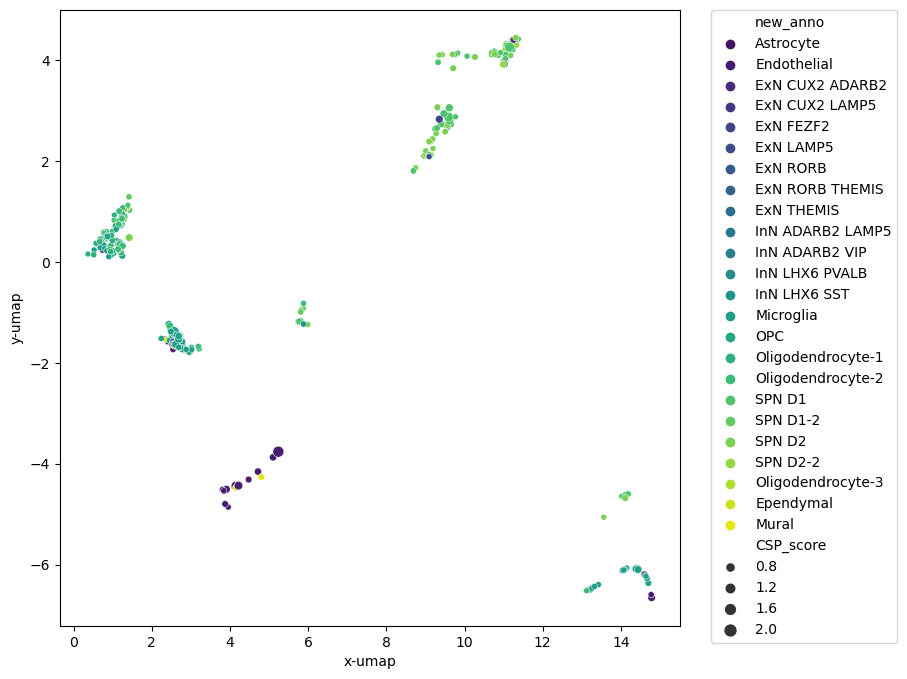

In [23]:
plot_umap_clusters(umap_df, hue_cov='new_anno', size_cov='CSP_score')
plot_umap_clusters(umap_df.loc[umap_df.CSP_score >= 0.5], hue_cov='new_anno', 
                   size_cov='CSP_score')

In [24]:
!date

Tue Oct 18 00:38:59 EDT 2022
